## **Advanced Pune Caffe Sales(Year 2000) Regression Project**

In [2]:
# Importing necessary libraries

import pandas as pd     # for data cleaning, filtering and manipulation
import numpy as np           # numpy used for numerical computing
import seaborn as sns           # for advance and beautiful visualizations
import matplotlib.pyplot as plt     # for creating visualizations
%matplotlib inline 
from ydata_profiling import ProfileReport     # for generating profile report     
import plotly.express as px         # interactive and web based plotting library in python
import warnings                 # for supressing warning messages during code execution
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)   # for displaying all columns

#### **Necessary Libraries**
- **`Pandas`** - Pandas is used for data analysis and handling tabular data like Excel.
It provides easy tools to load, clean, and explore data using DataFrames.
- **`Numpy`** - NumPy is a Python library used for fast mathematical and array operations.
It helps in working with large datasets using arrays, matrices, and functions.
- **`Seaborn`** - Seaborn is a Python library for making beautiful and simple statistical charts.
It is built on top of Matplotlib and works well with Pandas.
- **`Matplotlib`** - Matplotlib is used to create basic graphs like line, bar, and pie charts.
It helps in visualizing data in static and simple formats.
- **`Plotly`** - Plotly is a library for creating interactive and web-based charts.
It is used when you want zoomable and clickable graphs.
- **`%matplotlib inline`** - This is used in Jupyter Notebook to show plots right below your code cell.
It helps display Matplotlib charts inside the notebook.
warnings (import warnings)
- **`import warnings`** - import warnings is used to manage or ignore warning messages in Python.
It helps keep output clean and readable during code execution.
- **`ydata_profiling`** - ydata_profiling quickly creates an automatic EDA report from your data.
It gives summaries, graphs, and insights in one HTML file.

In [4]:
# Loading dataset using .read_csv() method of pandas

df = pd.read_csv("C:\\Users\\HP\\OneDrive\\Documents\\Advanced_Pune_Cafe_Sales_2000.csv")

In [5]:
# Displaying first five rows of the dataframe

df.head()

,order_id,date,outlet_location,outlet_manager,customer_type,item_category,item_name,quantity_sold,price_per_unit,total_bill,cost_price,profit,payment_mode,time_of_day,temperature_c,day_of_week,customer_rating,discount_percent,final_amount,special_event,staff_id,day_type,cumulative_sales_outlet
0,ORD51036,2025-10-19,Hinjewadi,Priya Nair,Regular,Snack,Cheese Garlic Bread,4,245,980,771.03,208.97,Cash,Morning,34.9,Sunday,3.1,15,833.00,Weekend Special,ST11,Weekend,833.00
1,ORD94971,2025-10-09,Kothrud,Arjun Mehta,Tourist,Beverage,Cappuccino,3,134,402,267.03,134.97,Card,Evening,25.3,Thursday,3.0,0,402.00,NaN,ST4,Weekday,402.00
2,ORD82709,2025-10-07,Viman Nagar,Rohit Deshmukh,Tourist,Beverage,Green Tea,3,243,729,519.16,209.84,Cash,Evening,29.0,Tuesday,4.8,5,692.55,Weekend Special,ST22,Weekday,692.55
3,ORD61541,2025-10-22,Viman Nagar,Rohit Deshmukh,Tourist,Beverage,Cappuccino,1,174,174,105.44,68.56,Card,Evening,25.7,Wednesday,4.8,0,174.00,Diwali Offer,ST22,Weekday,866.55
4,ORD20674,2025-10-07,Kothrud,Arjun Mehta,New,Dessert,Cheesecake,4,175,700,559.49,140.51,Card,Afternoon,26.8,Tuesday,4.4,15,595.00,Coffee Fest,ST4,Weekday,997.00


In [6]:
# Displaying last five rows of the dataframe

df.tail()

,order_id,date,outlet_location,outlet_manager,customer_type,item_category,item_name,quantity_sold,price_per_unit,total_bill,cost_price,profit,payment_mode,time_of_day,temperature_c,day_of_week,customer_rating,discount_percent,final_amount,special_event,staff_id,day_type,cumulative_sales_outlet
1995,ORD88057,2025-10-03,Viman Nagar,Rohit Deshmukh,New,Beverage,Hot Chocolate,4,169,676,468.12,207.88,Cash,Evening,25.8,Friday,4.9,15,574.6,Weekend Special,ST14,Weekday,188004.30
1996,ORD71910,2025-10-26,Viman Nagar,Rohit Deshmukh,Tourist,Dessert,Brownie,1,171,171,113.79,57.21,Cash,Night,32.5,Sunday,3.8,0,171.0,Coffee Fest,ST20,Weekend,188175.30
1997,ORD13597,2025-10-14,Kothrud,Arjun Mehta,Tourist,Snack,Pasta,4,162,648,516.21,131.79,Card,Afternoon,32.7,Tuesday,3.1,5,615.6,NaN,ST16,Weekday,175690.50
1998,ORD37000,2025-10-18,Koregaon Park,Amit Sharma,New,Snack,French Fries,3,234,702,515.19,186.81,Card,Morning,30.0,Saturday,3.2,10,631.8,NaN,ST10,Weekend,190355.85
1999,ORD86916,2025-10-22,Kothrud,Arjun Mehta,New,Beverage,Hot Chocolate,4,224,896,704.06,191.94,Card,Evening,25.2,Wednesday,3.0,5,851.2,NaN,ST11,Weekday,176541.70


In [7]:
# Displaying list of column names

print(df.columns.tolist())

['order_id', 'date', 'outlet_location', 'outlet_manager', 'customer_type', 'item_category', 'item_name', 'quantity_sold', 'price_per_unit', 'total_bill', 'cost_price', 'profit', 'payment_mode', 'time_of_day', 'temperature_c', 'day_of_week', 'customer_rating', 'discount_percent', 'final_amount', 'special_event', 'staff_id', 'day_type', 'cumulative_sales_outlet']


#### **Column Description**
- **`order_id`** – Unique id for each order.
- **`date`** – Date when the order was placed.
- **`outlet_location`** – Location or branch of the outlet where the sale occurred.
- **`outlet_manager`** – Name  of the manager handling that outlet.
- **`customer_type`** – Type of customer (e.g., regular, new, member).
- **`item_category`** – Category to which the sold item belongs.
- **`item_name`** – Name of the product or item sold.
- **`quantity_sold`** – Number of units of the item sold in the order.
- **`price_per_unit`** – Selling price of one unit of the item.
- **`total_bill`** – Total amount before discount and taxes.
- **`cost_price`** – Original cost of the item to the outlet.
- **`profit`** – Profit earned from the order or item sale.
- **`payment_mode`** – Mode of payment used (e.g., cash, card, UPI).
- **`time_of_day`** – Time slot of the sale (e.g., morning, afternoon, evening).
- **`temperature_c`** – Temperature in Celsius at the time of the sale.
- **`day_of_week`** – Day on which the sale occurred (e.g., Monday, Friday).
- **`customer_rating`** – Rating given by the customer after purchase.
- **`discount_percent`** – Discount percentage applied on the bill.
- **`final_amount`** – Final payable amount after discount.
- **`special_event`** – Indicates if the sale occurred during any special event or festival.
- **`staff_id`** – Identifier of the staff member who processed the order.
- **`day_type`** – Type of day (e.g., weekday, weekend, holiday).
- **`cumulative_sales_outlet`** – Running total of all sales for the outlet up to that date.


In [9]:
# Generating profile report before cleaning the dataset

Profile = ProfileReport(df)
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:00<00:00, 35.41it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# Displaying some random samples from the dataset

df.sample(6)

,order_id,date,outlet_location,outlet_manager,customer_type,item_category,item_name,quantity_sold,price_per_unit,total_bill,cost_price,profit,payment_mode,time_of_day,temperature_c,day_of_week,customer_rating,discount_percent,final_amount,special_event,staff_id,day_type,cumulative_sales_outlet
237,ORD90647,2025-10-26,Koregaon Park,Amit Sharma,Tourist,Beverage,Cappuccino,3,284,852,532.99,319.01,Card,Afternoon,32.2,Sunday,3.8,15,724.20,NaN,ST25,Weekend,23058.55
523,ORD28994,2025-10-06,Koregaon Park,Amit Sharma,Tourist,Snack,Cheese Garlic Bread,2,201,402,242.51,159.49,UPI,Night,33.1,Monday,4.2,0,402.00,Weekend Special,ST12,Weekday,57835.30
1581,ORD42362,2025-10-31,Viman Nagar,Rohit Deshmukh,Regular,Snack,Cheese Garlic Bread,2,226,452,302.63,149.37,Cash,Morning,31.1,Friday,4.5,15,384.20,Coffee Fest,ST3,Weekday,135831.10
488,ORD57239,2025-10-07,Kothrud,Arjun Mehta,New,Snack,Burger,3,211,633,444.51,188.49,Card,Night,33.9,Tuesday,4.1,15,538.05,Diwali Offer,ST1,Weekday,43616.30
422,ORD27810,2025-10-01,Viman Nagar,Rohit Deshmukh,Tourist,Dessert,Chocolate Muffin,3,119,357,249.18,107.82,Cash,Night,32.6,Wednesday,4.7,5,339.15,Diwali Offer,ST9,Weekday,33376.40
1897,ORD17601,2025-10-06,Koregaon Park,Amit Sharma,Tourist,Beverage,Hot Chocolate,4,159,636,462.04,173.96,Cash,Morning,33.5,Monday,4.3,10,572.40,NaN,ST20,Weekday,178200.20


In [11]:
# Displaying datatypes of columns

df.dtypes

order_id                    object
date                        object
outlet_location             object
outlet_manager              object
customer_type               object
item_category               object
item_name                   object
quantity_sold                int64
price_per_unit               int64
total_bill                   int64
cost_price                 float64
profit                     float64
payment_mode                object
time_of_day                 object
temperature_c              float64
day_of_week                 object
customer_rating            float64
discount_percent             int64
final_amount               float64
special_event               object
staff_id                    object
day_type                    object
cumulative_sales_outlet    float64
dtype: object

In [12]:
# Here datatype of date is object, so we will convert it to datetime 

df['date'] = pd.to_datetime(df['date'])

In [13]:
# Extracting columns from the date

# Creating new features Year, Month, Day, Weekday, Weekend from 'Date' feature
df['Year'] = df['date'].dt.year       # year from the date
df['Month'] = df['date'].dt.month          # month from the date
df['Day'] = df['date'].dt.day          # day number from the date
df['IsWeekend'] = df['day_of_week'].isin(['Saturday', 'Sunday']).astype(int)     # isweekend or not(yes or no)

In [14]:
# Now here we are removing three columns order_id, staff_id and outlet_manager because they are not important or useful for our regression models and they will not influence our target column

# Dropping 'order_id'
df.drop(columns='order_id', axis=1, inplace=True)

# Dropping 'staff_id'
df.drop(columns='staff_id', axis=1, inplace=True)

# Dropping 'outlet_manager'
df.drop(columns='outlet_manager', axis=1, inplace=True)

# Also we have extracted new columns from the column 'date' so we can drop column date
df.drop(columns='date', axis=1, inplace=True)

In [15]:
# Displcaying shape of the dataframe

df.shape

(2000, 23)

**Their are 2000 records and 20 columns present in the dataset.**

In [17]:
# Checking total number of missing values present in every column of the dataset

df.isnull().sum()

outlet_location               0
customer_type                 0
item_category                 0
item_name                     0
quantity_sold                 0
price_per_unit                0
total_bill                    0
cost_price                    0
profit                        0
payment_mode                  0
time_of_day                   0
temperature_c                 0
day_of_week                   0
customer_rating               0
discount_percent              0
final_amount                  0
special_event              1407
day_type                      0
cumulative_sales_outlet       0
Year                          0
Month                         0
Day                           0
IsWeekend                     0
dtype: int64

In [18]:
# Their are 1407 missing values are present in 'special_event' column, so we will fill it will keyword 'unknown'

df['special_event'] = df['special_event'].fillna('Unknown')

In [19]:
# Checking missing values again after filling them

df.isnull().sum()

outlet_location            0
customer_type              0
item_category              0
item_name                  0
quantity_sold              0
price_per_unit             0
total_bill                 0
cost_price                 0
profit                     0
payment_mode               0
time_of_day                0
temperature_c              0
day_of_week                0
customer_rating            0
discount_percent           0
final_amount               0
special_event              0
day_type                   0
cumulative_sales_outlet    0
Year                       0
Month                      0
Day                        0
IsWeekend                  0
dtype: int64

In [20]:
# Checking total number of duplicate records present in the dataset

df.duplicated().sum()

0

**Dataset has now no missing values and duplicate records.**

In [22]:
# Getting statistical summary of numerical columns

df.describe()

,quantity_sold,price_per_unit,total_bill,cost_price,profit,temperature_c,customer_rating,discount_percent,final_amount,cumulative_sales_outlet,Year,Month,Day,IsWeekend
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.0,2000.0,2000.000000,2000.00000
mean,2.499500,200.353000,500.813500,350.866920,149.946580,29.518550,3.993100,7.642500,462.413100,92518.355200,2025.0,10.0,15.999500,0.25850
std,1.113831,58.527866,274.319218,195.203022,88.624357,3.165595,0.581938,5.519957,255.380474,53543.128595,0.0,0.0,8.954306,0.43792
min,1.000000,100.000000,100.000000,63.150000,21.620000,24.000000,3.000000,0.000000,85.850000,203.300000,2025.0,10.0,1.000000,0.00000
25%,2.000000,150.000000,267.750000,183.082500,79.637500,26.775000,3.500000,5.000000,246.575000,46386.687500,2025.0,10.0,8.000000,0.00000
50%,3.000000,201.000000,460.000000,316.375000,131.355000,29.600000,4.000000,10.000000,421.900000,91790.750000,2025.0,10.0,16.000000,0.00000
75%,3.000000,249.000000,696.750000,478.690000,203.172500,32.300000,4.500000,15.000000,636.300000,138889.637500,2025.0,10.0,24.000000,1.00000
max,4.000000,300.000000,1200.000000,946.730000,477.600000,35.000000,5.000000,15.000000,1200.000000,190768.200000,2025.0,10.0,31.000000,1.00000


In [23]:
# Getting statistical summary of catgorical columns

df.describe(include=[object])

,outlet_location,customer_type,item_category,item_name,payment_mode,time_of_day,day_of_week,special_event,day_type
count,2000,2000,2000,2000,2000,2000,2000,2000,2000
unique,5,3,3,17,3,4,7,4,2
top,Koregaon Park,Tourist,Beverage,Ice Cream,Card,Morning,Wednesday,Unknown,Weekday
freq,428,675,696,145,683,524,324,1407,1483


### **Summary of categorical columns -**
#### **`Outlet Location`**
- It has 5 unique categories.
- Top category is 'Koregaon Park' with a frequency 428.
#### **`Customer Type`**
- It has 3 unique categories.
- Top category is 'Tourist' with a frequency 675.
#### **`Item Category`**
- It has 3 unique categories.
- Top category is 'Beverage' with a frequency 696.
#### **`Item Name`**
- It has 17 unique categories.
- Top category is 'Ice Cream' with a frequency 145.
#### **`Payment Mode`**
- It has 3 unique categories.
- Top category is 'Card' with a frequency 683.
#### **`Time of day`**
- It has 4 unique categories.
- Top category is 'Morning' with a frequency 524.
#### **`Day of week`**
- It has 7 unique categories.
- Top category is 'Wednesday' with a frequency 324.
#### **`Special Event`**
- It has 4 unique categories.
- Top category is 'Unknown' with a frequency 1407.
#### **`Day Type`**
- It has 2 unique categories.
- Top category is 'weekday' with a frequency 1483.

In [25]:
# Creating two lists one for all categorical columns and another for numerical columns

# List of categorical columns
cat_col = ['outlet_location', 'customer_type', 'item_category', 'item_name', 'payment_mode', 'time_of_day', 'special_event', 'day_type', 'day_of_week','Year', 'Month', 'Day', 'IsWeekend']

# List of numerical columns
num_col =  ['quantity_sold', 'price_per_unit', 'total_bill','cost_price', 'profit', 'cumulative_sales_outlet', 'customer_rating', 'discount_percent', 'final_amount','cumulative_sales_outlet']
        

In [26]:
# getting no of unique values in categorical column

for col in cat_col:
    print(f'\nNo of unique values in {col} column are :')
    print(df[col].nunique())


No of unique values in outlet_location column are :
5

No of unique values in customer_type column are :
3

No of unique values in item_category column are :
3

No of unique values in item_name column are :
17

No of unique values in payment_mode column are :
3

No of unique values in time_of_day column are :
4

No of unique values in special_event column are :
4

No of unique values in day_type column are :
2

No of unique values in day_of_week column are :
7

No of unique values in Year column are :
1

No of unique values in Month column are :
1

No of unique values in Day column are :
31

No of unique values in IsWeekend column are :
2


In [27]:
# getting no of unique values in numerical column

for col in num_col:
    print(f'\nNo of unique values in {col} column are :')
    print(df[col].nunique())


No of unique values in quantity_sold column are :
4

No of unique values in price_per_unit column are :
201

No of unique values in total_bill column are :
581

No of unique values in cost_price column are :
1969

No of unique values in profit column are :
1935

No of unique values in cumulative_sales_outlet column are :
1999

No of unique values in customer_rating column are :
21

No of unique values in discount_percent column are :
4

No of unique values in final_amount column are :
1258

No of unique values in cumulative_sales_outlet column are :
1999


In [28]:
# getting unique values in categorical column

for col in cat_col:
    print(f'\nUnique values in {col} column are :')
    print(df[col].unique())


Unique values in outlet_location column are :
['Hinjewadi' 'Kothrud' 'Viman Nagar' 'Baner' 'Koregaon Park']

Unique values in customer_type column are :
['Regular' 'Tourist' 'New']

Unique values in item_category column are :
['Snack' 'Beverage' 'Dessert']

Unique values in item_name column are :
['Cheese Garlic Bread' 'Cappuccino' 'Green Tea' 'Cheesecake'
 'Veg Sandwich' 'Chocolate Muffin' 'Paneer Wrap' 'French Fries'
 'Ice Cream' 'Masala Chai' 'Donut' 'Cold Coffee' 'Hot Chocolate' 'Burger'
 'Brownie' 'Iced Latte' 'Pasta']

Unique values in payment_mode column are :
['Cash' 'Card' 'UPI']

Unique values in time_of_day column are :
['Morning' 'Evening' 'Afternoon' 'Night']

Unique values in special_event column are :
['Weekend Special' 'Unknown' 'Diwali Offer' 'Coffee Fest']

Unique values in day_type column are :
['Weekend' 'Weekday']

Unique values in day_of_week column are :
['Sunday' 'Thursday' 'Tuesday' 'Wednesday' 'Monday' 'Friday' 'Saturday']

Unique values in Year column are :


In [29]:
# getting value counts of categorical columns

for col in cat_col:
    counts = df[col].value_counts()
    print(f'\nValue_counts for {col} column :')
    print(counts)


Value_counts for outlet_location column :
outlet_location
Koregaon Park    428
Hinjewadi        405
Viman Nagar      399
Baner            389
Kothrud          379
Name: count, dtype: int64

Value_counts for customer_type column :
customer_type
Tourist    675
Regular    674
New        651
Name: count, dtype: int64

Value_counts for item_category column :
item_category
Beverage    696
Snack       665
Dessert     639
Name: count, dtype: int64

Value_counts for item_name column :
item_name
Ice Cream              145
Iced Latte             145
Brownie                140
Cappuccino             131
Hot Chocolate          129
Paneer Wrap            124
Chocolate Muffin       122
French Fries           120
Cold Coffee            120
Donut                  117
Cheesecake             115
Burger                 114
Cheese Garlic Bread    110
Pasta                   99
Veg Sandwich            98
Masala Chai             87
Green Tea               84
Name: count, dtype: int64

Value_counts for payme

In [30]:
# getting highest value for each numerical column

for column in num_col:
    print(f'\nMax value of {column} column is :')
    print(df[column].max())


Max value of quantity_sold column is :
4

Max value of price_per_unit column is :
300

Max value of total_bill column is :
1200

Max value of cost_price column is :
946.73

Max value of profit column is :
477.6

Max value of cumulative_sales_outlet column is :
190768.2

Max value of customer_rating column is :
5.0

Max value of discount_percent column is :
15

Max value of final_amount column is :
1200.0

Max value of cumulative_sales_outlet column is :
190768.2


In [31]:
# getting lowest value for each numerical column

for column in num_col:
    print(f'\nMin value of {column} column is :')
    print(df[column].min())


Min value of quantity_sold column is :
1

Min value of price_per_unit column is :
100

Min value of total_bill column is :
100

Min value of cost_price column is :
63.15

Min value of profit column is :
21.62

Min value of cumulative_sales_outlet column is :
203.3

Min value of customer_rating column is :
3.0

Min value of discount_percent column is :
0

Min value of final_amount column is :
85.85

Min value of cumulative_sales_outlet column is :
203.3


In [32]:
# getting top(most frequent) value of each categorical feature

for col in cat_col:
    print(f'\nTop value of {column} column is :')
    print(df[col].mode()[0])


Top value of cumulative_sales_outlet column is :
Koregaon Park

Top value of cumulative_sales_outlet column is :
Tourist

Top value of cumulative_sales_outlet column is :
Beverage

Top value of cumulative_sales_outlet column is :
Ice Cream

Top value of cumulative_sales_outlet column is :
Card

Top value of cumulative_sales_outlet column is :
Morning

Top value of cumulative_sales_outlet column is :
Unknown

Top value of cumulative_sales_outlet column is :
Weekday

Top value of cumulative_sales_outlet column is :
Wednesday

Top value of cumulative_sales_outlet column is :
2025

Top value of cumulative_sales_outlet column is :
10

Top value of cumulative_sales_outlet column is :
1

Top value of cumulative_sales_outlet column is :
0


In [33]:
# Checking skewness or shape of the data

for col in num_col:
    skew = df[col].skew()
    print(f"The skewness of column '{col}' is {round(skew,3)}\n")

The skewness of column 'quantity_sold' is -0.003

The skewness of column 'price_per_unit' is -0.02

The skewness of column 'total_bill' is 0.589

The skewness of column 'cost_price' is 0.641

The skewness of column 'profit' is 0.897

The skewness of column 'cumulative_sales_outlet' is 0.019

The skewness of column 'customer_rating' is 0.027

The skewness of column 'discount_percent' is -0.024

The skewness of column 'final_amount' is 0.639

The skewness of column 'cumulative_sales_outlet' is 0.019



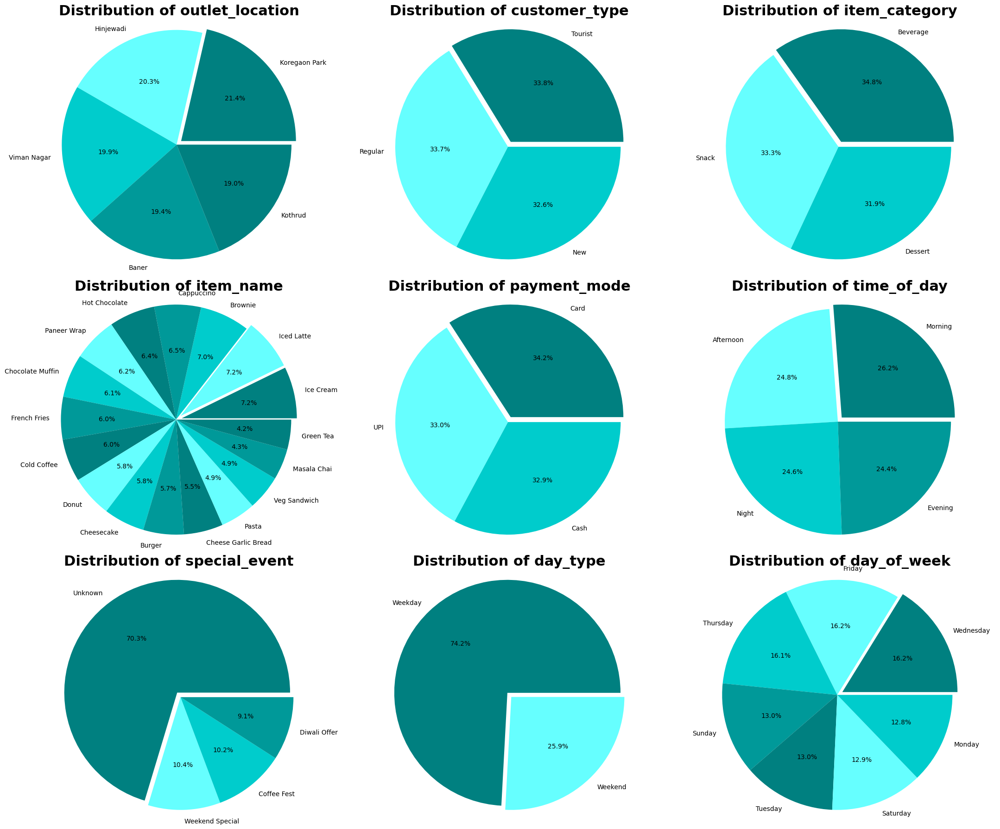

In [34]:
# List of categorical columns for pie charts

# List of categorical columns
cat_col = ['outlet_location', 'customer_type', 'item_category', 'item_name', 'payment_mode', 'time_of_day', 'special_event', 'day_type', 'day_of_week']

custom_colors = ['#008080', '#66ffff', '#00cccc','#009999']

# creating 6 rows and 3 columns plots in subplot
fig, axes = plt.subplots(3, 3, figsize=(22, 18))

# Change axes to 1D list so loop is easy
axes = axes.flatten()

# Go through each column in list
for i, col in enumerate(cat_col):
    # value_counts
    counts = df[col].value_counts()

    # Push out the biggest slice
    explode = [0.05 if v == counts.max() else 0 for v in counts]

    # Make pie chart
    axes[i].pie(counts,
                labels=counts.index,     # labels for each slice
                autopct='%1.1f%%',       # show percentage upto one decimal point
                colors=custom_colors,   
                explode=explode)         # push biggest slice

    # Title for pie chart
    axes[i].set_title(f'Distribution of {col}', fontsize=22, fontweight='bold')

    # it Keep pie chart round
    axes[i].axis('equal')

# Hide extra empty plots
for j in range(len(cat_col), len(axes)):
    axes[j].axis('off')

# Adjust space between plots and overlapping
plt.tight_layout()

# Show all charts
plt.show()

In [35]:
# Using Interquartile range to check outliers 

for col in num_col:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if not outliers.empty:
        print(f"Column '{col}' has {len(outliers)} outliers.")
    else:
        print(f"Column '{col}' has no outliers.")

Column 'quantity_sold' has no outliers.
Column 'price_per_unit' has no outliers.
Column 'total_bill' has no outliers.
Column 'cost_price' has 3 outliers.
Column 'profit' has 36 outliers.
Column 'cumulative_sales_outlet' has no outliers.
Column 'customer_rating' has no outliers.
Column 'discount_percent' has no outliers.
Column 'final_amount' has no outliers.
Column 'cumulative_sales_outlet' has no outliers.


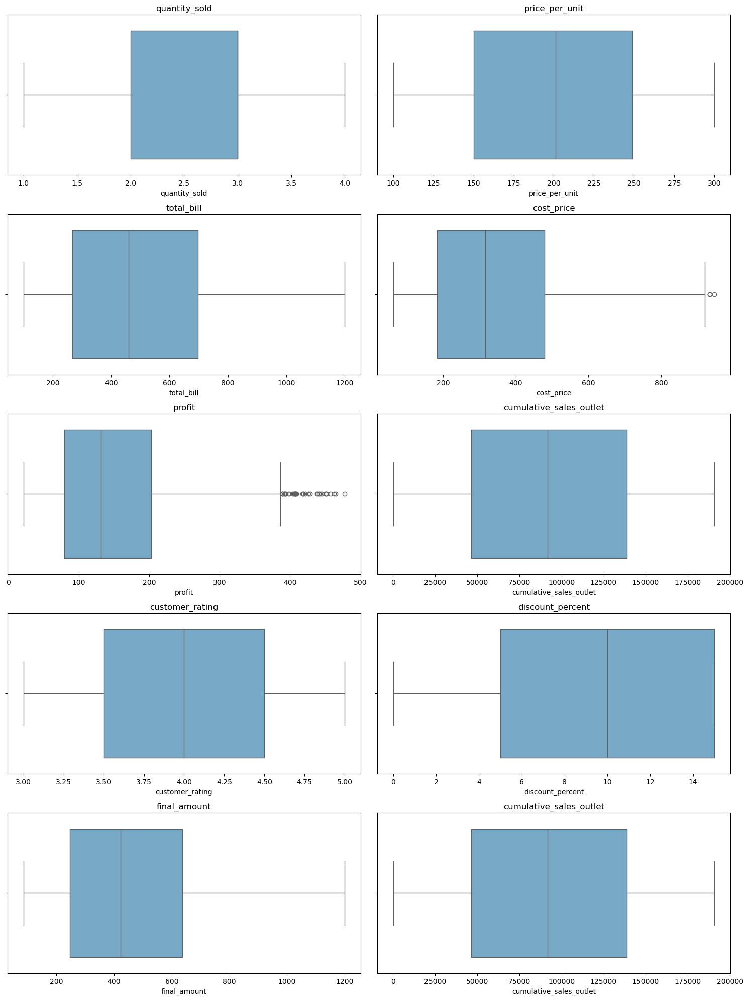

In [36]:
# Plotting boxplot to detect outliers 

# Create a figure with 7 rows and 2 columns of subplot
# Axes is individual plot where we plot boxplot here
fig, axes = plt.subplots(5, 2, figsize=(15, 20))

# Flatten the 2D array of axes into a 1D array so we can loop easily
axes = axes.flatten()

# Iterate throught each column with position which helps to pick up correct subplot
for i, col in enumerate(num_col):
    sns.boxplot(x=df[col], ax=axes[i],palette="Blues")
    axes[i].set_title(col)

# Adjusting the layout so that the plots don't overlap with each other
plt.tight_layout()
plt.show()

#### **`Distribution of quantity sold`** -
- The middle 50% of quantity sold are between around 1 and 3.
- The median rented bike count is near 500.
- The lower whisker is 1 and the upper whisker is 4.
- There are no outliers present in quantity sold column.

#### **`Distribution of price per unit`** -
- The middle 50% values of price per unit are between around 150 and 250.
- The median price per unit value is near 200.
- The lower whisker is near -18 and the upper whisker is near 40.
- There are no outliers present in Temperature column.

#### **`Distribution of total bill`** -
- The middle 50% values of total bill are between around 300 and 700.
- The median value of total bill is near 450.
- The lower whisker is near 100 and the upper whisker is near 1200.
- There are no outliers present in total bill column.

#### **`Distribution of cost price`** -
- The middle 50% values of cost price are between around 200 and 500.
- The median cost price is near 300.
- The lower whisker is near 100 and the upper whisker is near 900.
- **There are few high outliers present in wind cost price column.**

#### **`Distribution of profit`** -
- The middle 50% values of profit are between around 80 and 210.
- The median value of profit is near 130.
- The lower whisker is 0 and the upper whisker is near 400.
- **There are extreme high outliers present in profit column.**

**`In this dataset 3 outliers in cost_price column and 36 outliers in profit.`**

In [39]:
# Here we are going to remove the outliers because no of outliers are very few

for col in num_col:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    df = df[(df[col] >= lower) & (df[col] <= upper)]

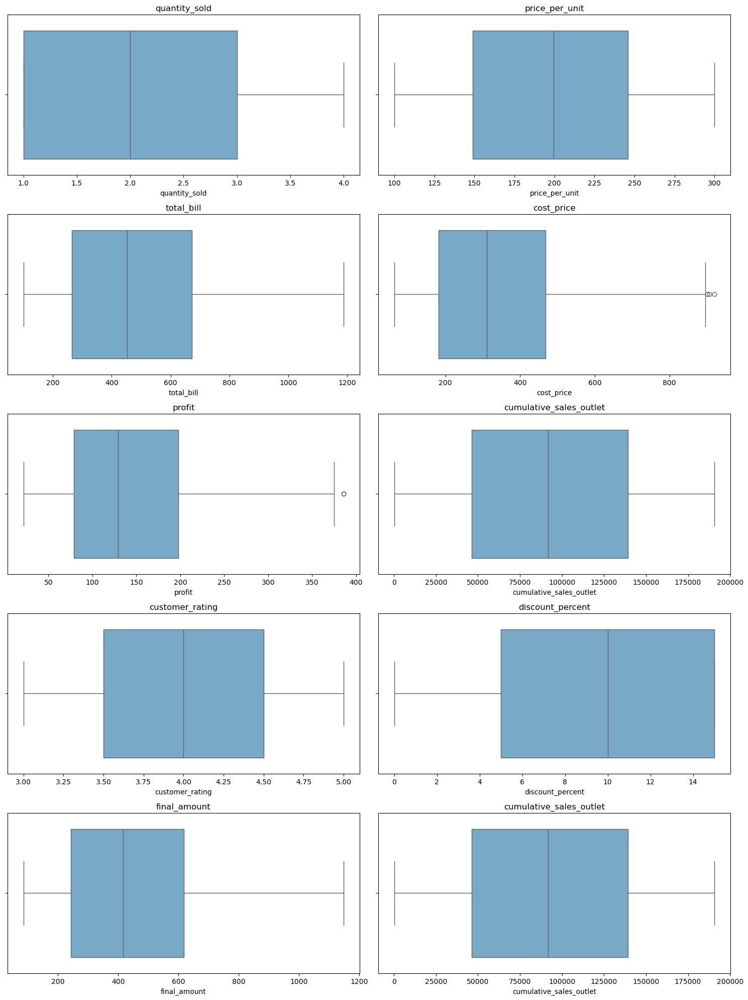

In [40]:
# Plotting boxplot to detect outliers 

# Create a figure with 7 rows and 2 columns of subplot
# Axes is individual plot where we plot boxplot here
fig, axes = plt.subplots(5, 2, figsize=(15, 20))

# Flatten the 2D array of axes into a 1D array so we can loop easily
axes = axes.flatten()

# Iterate throught each column with position which helps to pick up correct subplot
for i, col in enumerate(num_col):
    sns.boxplot(x=df[col], ax=axes[i], palette="Blues")
    axes[i].set_title(col)

# Adjusting the layout so that the plots don't overlap with each other
plt.tight_layout()
plt.show()

In [41]:
# Here we are using log transformation to handle remaining outliers
# Log Transformation is a technique used to reduce the effect of extreme values (outliers) and make skewed data more normal.

df['cost_price'] = np.log1p(df['cost_price'])
df['profit'] = np.log1p(df['profit'])

In [42]:
# Using Interquartile range to check outliers after handling 

for col in num_col:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if not outliers.empty:
        print(f"Column '{col}' has {len(outliers)} outliers.")
    else:
        print(f"Column '{col}' has no outliers.")

Column 'quantity_sold' has no outliers.
Column 'price_per_unit' has no outliers.
Column 'total_bill' has no outliers.
Column 'cost_price' has no outliers.
Column 'profit' has no outliers.
Column 'cumulative_sales_outlet' has no outliers.
Column 'customer_rating' has no outliers.
Column 'discount_percent' has no outliers.
Column 'final_amount' has no outliers.
Column 'cumulative_sales_outlet' has no outliers.


**`Now dataset has no missing values, no duplicate records and no outliers.`**

In [44]:
# Generating profile report after cleaning the dataset

Profile = ProfileReport(df)
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:00<00:00, 51.60it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

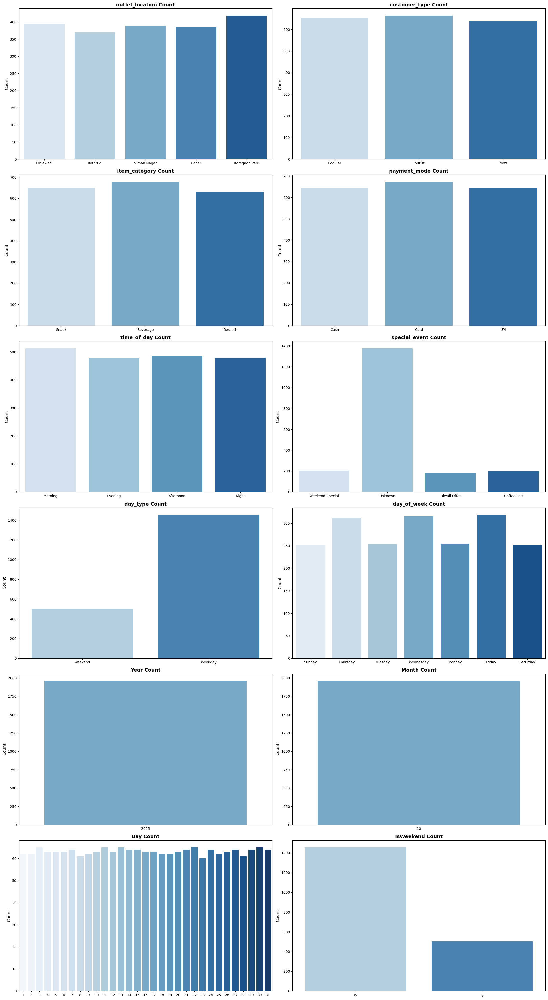

In [45]:
# Displaying countplot for categorical columns

# List of categorical columns
cat_col = ['outlet_location', 'customer_type', 'item_category', 'payment_mode', 'time_of_day', 'special_event', 'day_type', 'day_of_week','Year', 'Month', 'Day', 'IsWeekend']

# Create subplots: 3 rows, 3 columns
fig, axes = plt.subplots(6, 2 , figsize=(22, 40)) 

# Flatten the 2D array of axes to 1D
axes = axes.flatten()

# Plot each categorical column
for i, col in enumerate(cat_col):
    if col != 'iteam_name':
        sns.countplot(data=df, x=col, palette="Blues", ax=axes[i])
        axes[i].set_title(f'{col} Count', fontweight='bold', fontsize=14)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('Count', fontsize=12)
plt.xticks(rotation=50)
plt.tight_layout()
plt.show()

#### **`Outlet Location Count`**
- Here are five unique outlets and all of have above 250 orders count.
- Top catgory is Koregaon Park having more than 400 orders count.
#### **`Customers Type Count`**
- Here are three types of customers(regular, tourist, new) and all of have count above 600.
#### **`Item Category Count`**
- Here are three item categories which are snack, beverage and dessert and all of this have above 600 count.
- Top category is beverage with near count of 650.
#### **`Payment Mode Count`**
- Here are three iunique payment modes(cash, card, upi).
- Customers done payments using all of this three modes with count above 600.
- Top mode is card with near count of 650
#### **`Time of the day Count`**
- Customers visit caffe's to morning, afternoon, evening as well as night and all have count above 450.
- top time of the day is morning with the frequency above 500 orders count.
#### **`Special Event Count`**
- Above 1300 events are unknown.
- Weekend special, diwali offer, coffee fest have count below 200.
#### **`Day Type Count`**
- Near 500 days are weekends and above 1400 days are weekdays.
#### **`Day of Week Count`**
- Thursday, Wednesday and Friday orders count is above 300.
- Sunday, Tuesday, Monday and Saturday orders count is below 250.
#### **`Year Count`**
- All of this records of the year 2024.
#### **`Month Count`**
- All of this records of the month October.
#### **`Days Count`**
- All of this 31 days have above 60 orders.

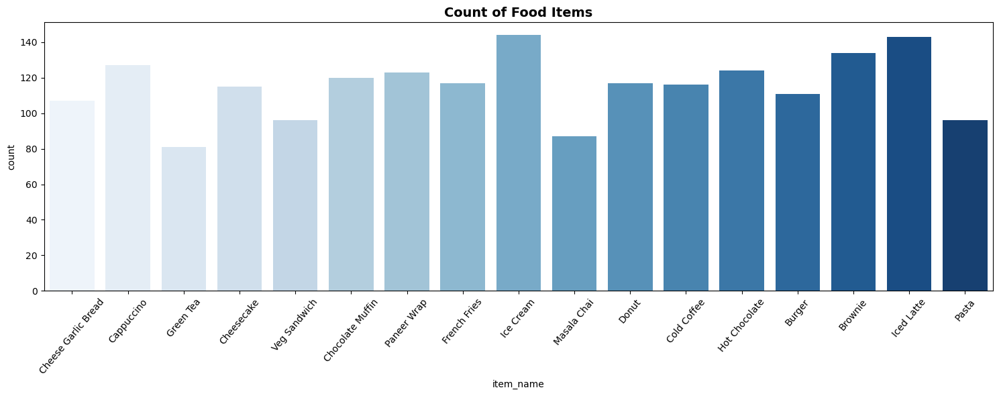

In [47]:
# Countplot for food items

plt.figure(figsize=(15, 6))
sns.countplot(data=df, x='item_name', palette="Blues")
plt.xticks(rotation=50)
plt.title('Count of Food Items',fontweight='bold', fontsize=14)
plt.tight_layout()
plt.show()

#### **`Count of Food item`**
- Above 140 orders have food item Ice Cream and Ice Latte.
- All of this food items are ordered in above 60 orders.

In [49]:
df.head()

,outlet_location,customer_type,item_category,item_name,quantity_sold,price_per_unit,total_bill,cost_price,profit,payment_mode,time_of_day,temperature_c,day_of_week,customer_rating,discount_percent,final_amount,special_event,day_type,cumulative_sales_outlet,Year,Month,Day,IsWeekend
0,Hinjewadi,Regular,Snack,Cheese Garlic Bread,4,245,980,6.649023,5.346965,Cash,Morning,34.9,Sunday,3.1,15,833.00,Weekend Special,Weekend,833.00,2025,10,19,1
1,Kothrud,Tourist,Beverage,Cappuccino,3,134,402,5.591099,4.912434,Card,Evening,25.3,Thursday,3.0,0,402.00,Unknown,Weekday,402.00,2025,10,9,0
2,Viman Nagar,Tourist,Beverage,Green Tea,3,243,729,6.254136,5.351100,Cash,Evening,29.0,Tuesday,4.8,5,692.55,Weekend Special,Weekday,692.55,2025,10,7,0
3,Viman Nagar,Tourist,Beverage,Cappuccino,1,174,174,4.667581,4.242190,Card,Evening,25.7,Wednesday,4.8,0,174.00,Diwali Offer,Weekday,866.55,2025,10,22,0
4,Kothrud,New,Dessert,Cheesecake,4,175,700,6.328811,4.952370,Card,Afternoon,26.8,Tuesday,4.4,15,595.00,Coffee Fest,Weekday,997.00,2025,10,7,0


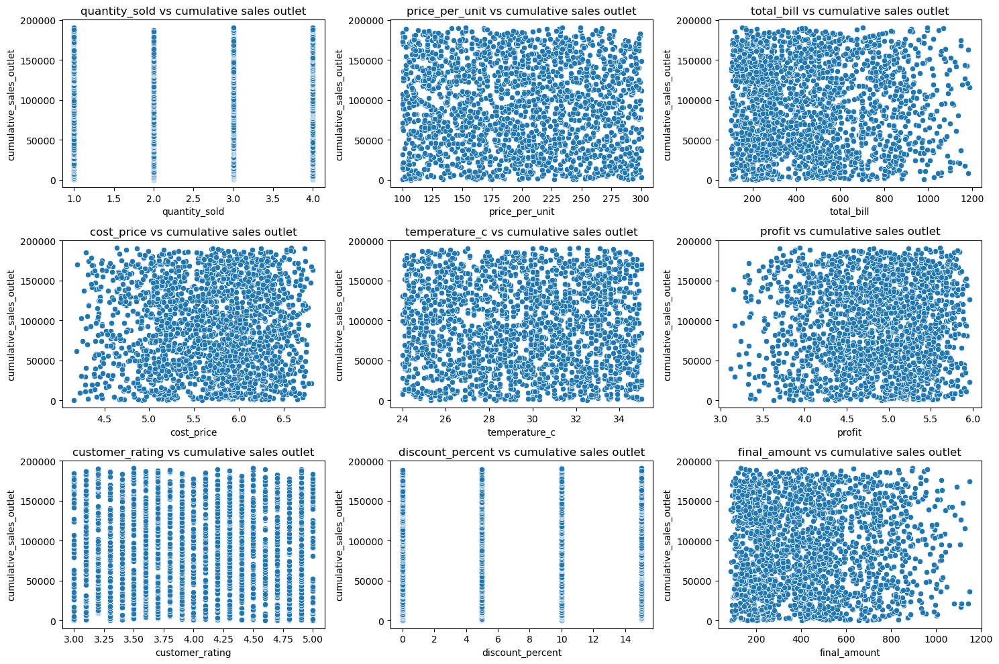

In [50]:
# Plotting scatterplot of numerical columns with target column

# List of numerical columns
num_col =  ['quantity_sold', 'price_per_unit', 'total_bill','cost_price','temperature_c' ,'profit','customer_rating', 'discount_percent', 'final_amount']
        
fig, axes = plt.subplots(3,3, figsize=(15, 10))  
axes = axes.flatten() 

for i, col in enumerate(num_col):
    sns.scatterplot(x=df[col], y=df['cumulative_sales_outlet'], ax=axes[i])
    axes[i].set_title(f'{col} vs cumulative sales outlet')

plt.tight_layout()  # Adjust spacing
plt.show()

In [51]:
from sklearn.preprocessing import LabelEncoder  # import LabelEncoder from sklearn.preprocessing
le = LabelEncoder()  # initialize label encoder

# List of categorical columns
cat_col = ['outlet_location', 'customer_type','item_name', 'item_category', 'payment_mode', 'time_of_day', 'special_event', 'day_type', 'day_of_week','Year', 'Month', 'Day', 'IsWeekend']

# Apply label encoding to each categorical column
for col in cat_col:
    df[col] = le.fit_transform(df[col])  # Convert categories to numbers

In [52]:
df.head()    # now categorical columns are converted into numerical

,outlet_location,customer_type,item_category,item_name,quantity_sold,price_per_unit,total_bill,cost_price,profit,payment_mode,time_of_day,temperature_c,day_of_week,customer_rating,discount_percent,final_amount,special_event,day_type,cumulative_sales_outlet,Year,Month,Day,IsWeekend
0,1,1,2,3,4,245,980,6.649023,5.346965,1,2,34.9,3,3.1,15,833.00,3,1,833.00,0,0,18,1
1,3,2,0,2,3,134,402,5.591099,4.912434,0,1,25.3,4,3.0,0,402.00,2,0,402.00,0,0,8,0
2,4,2,0,9,3,243,729,6.254136,5.351100,1,1,29.0,5,4.8,5,692.55,3,0,692.55,0,0,6,0
3,4,2,0,2,1,174,174,4.667581,4.242190,0,1,25.7,6,4.8,0,174.00,1,0,866.55,0,0,21,0
4,3,0,1,4,4,175,700,6.328811,4.952370,0,0,26.8,5,4.4,15,595.00,0,0,997.00,0,0,6,0


In [53]:
df.columns

Index(['outlet_location', 'customer_type', 'item_category', 'item_name',
       'quantity_sold', 'price_per_unit', 'total_bill', 'cost_price', 'profit',
       'payment_mode', 'time_of_day', 'temperature_c', 'day_of_week',
       'customer_rating', 'discount_percent', 'final_amount', 'special_event',
       'day_type', 'cumulative_sales_outlet', 'Year', 'Month', 'Day',
       'IsWeekend'],
      dtype='object')

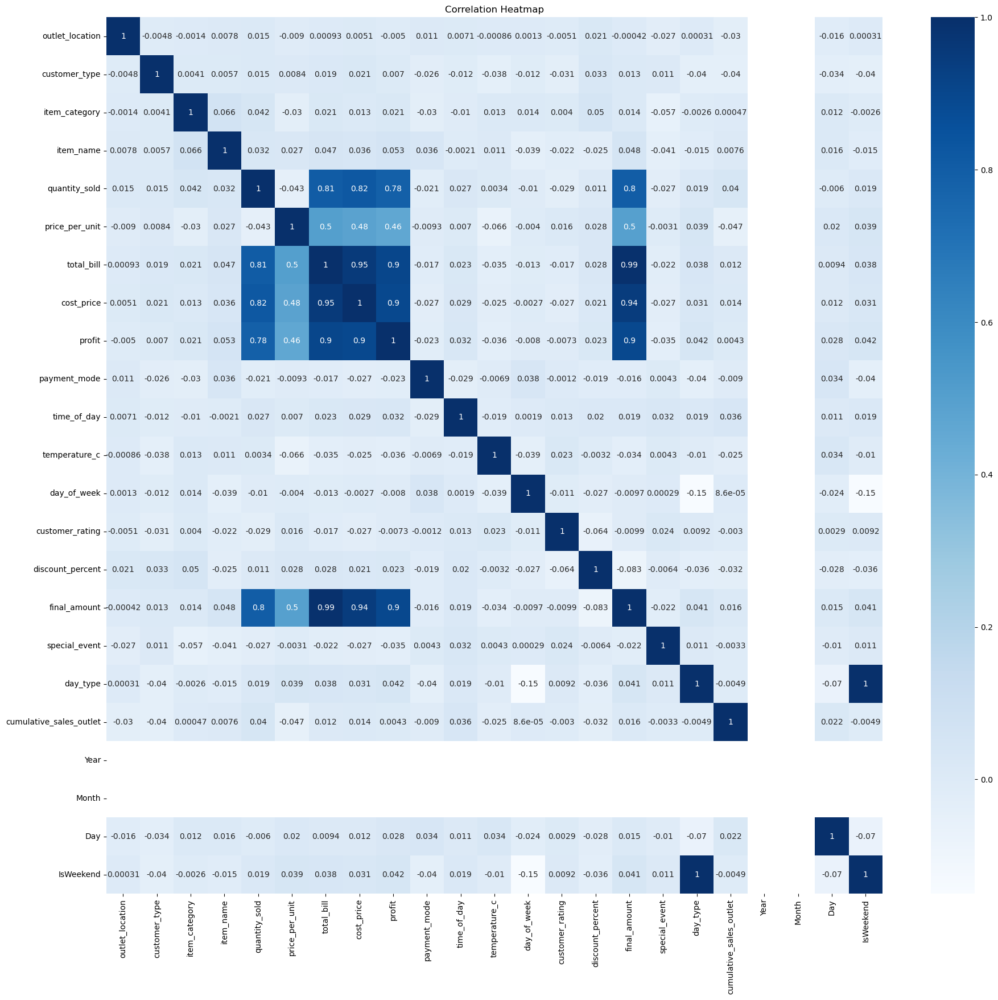

In [54]:
# Displaying correlation heatmap between all numerical columns

plt.figure(figsize=(22, 20))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='Blues')
plt.title('Correlation Heatmap')
plt.show()

### **`Top Positive Correlations`**
- cost price is highly correlated with final amount, quantity sold, price per unit, profit, total bill.
- total bill, cost price is highly correlated with final payment.
- profit is highly correlated with price per unit.
- quantity sold is highly correlated with total bill, cost price, profit.
                                                                

In [56]:
# Here we are using Robust Scaling because in this datset their are lots of outliers present

from sklearn.preprocessing import RobustScaler   # importing robust scaler from skleran.preprocessing
scaler = RobustScaler()                     # initializing robust scaler

# List of categorical columns
# cat_col = ['outlet_location', 'customer_type','item_name', 'item_category', 'payment_mode', 'time_of_day', 'special_event', 'day_type', 'day_of_week','Year', 'Month', 'Day', 'IsWeekend']

# List of columns with numerical values
cols = ['quantity_sold','price_per_unit','total_bill','cost_price','profit','final_amount']

# Applying robust scaler to each numerical columns
df[cols] = scaler.fit_transform(df[cols])

In [57]:
df.head()

,outlet_location,customer_type,item_category,item_name,quantity_sold,price_per_unit,total_bill,cost_price,profit,payment_mode,time_of_day,temperature_c,day_of_week,customer_rating,discount_percent,final_amount,special_event,day_type,cumulative_sales_outlet,Year,Month,Day,IsWeekend
0,1,1,2,3,1.0,0.469072,1.294911,0.957087,0.523686,1,2,34.9,3,3.1,15,1.114316,3,1,833.00,0,0,18,1
1,3,2,0,2,0.5,-0.675258,-0.122624,-0.162425,0.048129,0,1,25.3,4,3.0,0,-0.036859,2,0,402.00,0,0,8,0
2,4,2,0,9,0.5,0.448454,0.679338,0.539211,0.528211,1,1,29.0,5,4.8,5,0.739183,3,0,692.55,0,0,6,0
3,4,2,0,2,-0.5,-0.262887,-0.681790,-1.139705,-0.685396,0,1,25.7,6,4.8,0,-0.645833,1,0,866.55,0,0,21,0
4,3,0,1,4,1.0,-0.252577,0.608216,0.618234,0.091836,0,0,26.8,5,4.4,15,0.478632,0,0,997.00,0,0,6,0


In [58]:
from sklearn.model_selection import train_test_split  # import train_test_split to split the dataset into testing and training datasets

# Defining X and y
X = df.drop('cumulative_sales_outlet', axis=1)  # all columns except the target column
y = df['cumulative_sales_outlet']               # only target column

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [59]:
# Gradient Boosting Regressor

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
gb_model = GradientBoostingRegressor()
gb_model.fit(X_train, y_train)
y_pred = gb_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
print(f"R² Score: {r2}")

MAE: 47560.457167630135, MSE: 2995586017.512297, RMSE: 54731.94695524998
R² Score: -0.04192848169992813


In [60]:
# Gradient Boosting Regressor

gbr_model = GradientBoostingRegressor(
    n_estimators=150,    
    learning_rate=0.05, 
    max_depth=8,            # Maximum depth of each tree
    min_samples_split=10,   # Minimum samples required to split a node
    min_samples_leaf=5,     # Minimum samples required at a leaf
    random_state=42
)
gbr_model.fit(X_train, y_train)
y_pred_gbr = gbr_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred_gbr)
mse = mean_squared_error(y_test, y_pred_gbr)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred_gbr)
print(f"Gradient Boosting Regressor Results:")
print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

Gradient Boosting Regressor Results:
MAE: 47884.3037, MSE: 3120800998.5079, RMSE: 55864.1298, R²: -0.0855


In [61]:
# XGBoost Regressor

from xgboost import XGBRegressor
xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
print(f"R² Score: {r2}")

MAE: 49820.02313456633, MSE: 3498180993.626373, RMSE: 59145.42242326428
R² Score: -0.2167416959795947


In [62]:
# Decision Tree Regressor

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred_dt)
mse = mean_squared_error(y_test, y_pred_dt)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred_dt)
print(f"Decision Tree Regressor Results:")
print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

Decision Tree Regressor Results:
MAE: 58249.7967, MSE: 5143692961.6887, RMSE: 71719.5438, R²: -0.7891


In [63]:
# Multiple linear Regression

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
print(f"R² Score: {r2}")

MAE: 47334.75099363845, MSE: 2941515631.864312, RMSE: 54235.74127698738
R² Score: -0.023121652420520222


In [64]:
# Initializing all models
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42)
}

# Training and evaluating each model
results = {}
for model_name, model in models.items():
    # Training  model
    model.fit(X_train, y_train)
    
    # Making predictions
    y_pred_model = model.predict(X_test)
    
    # Evaluating metrics
    mae = mean_absolute_error(y_test, y_pred_model)
    mse = mean_squared_error(y_test, y_pred_model)
    rmse = mse ** 0.5
    r2 = r2_score(y_test, y_pred_model)
    
    # Storing results
    results[model_name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "R²": r2
    }

# Displaying results
results_df = pd.DataFrame(results).T
results_df.sort_values(by="R²", ascending=False)

,MAE,MSE,RMSE,R²
Random Forest,46290.967587,2.860375e+09,53482.471258,0.005101
Linear Regression,47334.750994,2.941516e+09,54235.741277,-0.023122
Gradient Boosting,47553.921997,2.991675e+09,54696.208085,-0.040568
XGBoost,49820.023135,3.498181e+09,59145.422423,-0.216742
Decision Tree,58249.796684,5.143693e+09,71719.543792,-0.789086
